# Processing notebook: preparing the draft for IoT Edge Device's main

## L2 calibrated data

### Setting up project root for module imports in Jupyter Notebook

In [1]:
# Import the os module to work with the file system
import os

# Get the absolute path of the current notebook.
# This assumes the notebook's name is "L2_tour.ipynb".
# Note: "L2_tour.ipynb" is located in the "notebooks" folder of the "oceanstream" repo.
# This folder is typically ignored to maintain a clear organization of the project.

notebook_path = os.path.abspath("L2_tour.ipynb")
print(f"notebook_path: {notebook_path}")
# Navigate up two directories from the notebook's path to get to the project root
# os.pardir represents the parent directory, so using it twice moves up two levels
project_root = os.path.abspath(os.path.join(notebook_path, os.pardir, os.pardir))

# Print the project root path to verify
print(f"project_root: {project_root}")

# Import the sys module to modify the Python path
import sys

# Append the project root to the Python path so that modules from the project can be imported
sys.path.append(project_root)

notebook_path: /Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/L2_tour.ipynb
project_root: /Users/simedroniraluca/Documents/pineview/oceanstream


Specifies the path to the test data utilized in this notebook:

In [2]:
L2_tour_data_path = os.path.join(project_root, "test_data", "L2_tour_data")

### Prepare the Data for Analysis (L0)

In [3]:
from oceanstream.L0_unprocessed_data import(
    raw_reader,    
)

In [4]:
# Using the `file_finder` method of `raw_reader` to search for specific file types in the "L2_tour_data" directory.
# Displaying all `.raw` files from the "L2_tour_data" directory
display(raw_reader.file_finder(L2_tour_data_path, file_type='raw'))

['/Users/simedroniraluca/Documents/pineview/oceanstream/test_data/L2_tour_data/D20161109-T163350.raw',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/test_data/L2_tour_data/Summer2017-D20170620-T011027.raw']

In [5]:
# Check files integirty
ek_80_info = raw_reader.file_integrity_checking(os.path.join(L2_tour_data_path, "D20161109-T163350.raw"))
ek_60_info = raw_reader.file_integrity_checking(os.path.join(L2_tour_data_path, "Summer2017-D20170620-T011027.raw"))
display(ek_80_info)
display(ek_60_info)

{'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/test_data/L2_tour_data/D20161109-T163350.raw',
 'campaign_id': 'D20161109',
 'date': datetime.datetime(2016, 11, 9, 16, 33, 50),
 'sonar_model': 'EK80',
 'file_integrity': True}

{'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/test_data/L2_tour_data/Summer2017-D20170620-T011027.raw',
 'campaign_id': 'Summer2017',
 'date': datetime.datetime(2017, 6, 20, 1, 10, 27),
 'sonar_model': 'EK60',
 'file_integrity': True}

In [6]:
# Read files
ek60_ek80_ds_list = raw_reader.read_raw_files([ek_60_info, ek_80_info])
ek60_ed = ek60_ek80_ds_list[0]
ek80_ed = ek60_ek80_ds_list[1]

In [7]:
ek60_ed

<EchoData: standardized raw data from Internal Memory>
Top-level: contains metadata about the SONAR-netCDF4 file format.
├── Environment: contains information relevant to acoustic propagation through water.
├── Platform: contains information about the platform on which the sonar is installed.
│   └── NMEA: contains information specific to the NMEA protocol.
├── Provenance: contains metadata about how the SONAR-netCDF4 version of the data were obtained.
├── Sonar: contains sonar system metadata and sonar beam groups.
│   └── Beam_group1: contains backscatter power (uncalibrated) and other beam or channel-specific data, including split-beam angle data when they exist.
└── Vendor_specific: contains vendor-specific information about the sonar and the data.

In [8]:
ek80_ed

<EchoData: standardized raw data from Internal Memory>
Top-level: contains metadata about the SONAR-netCDF4 file format.
├── Environment: contains information relevant to acoustic propagation through water.
├── Platform: contains information about the platform on which the sonar is installed.
│   └── NMEA: contains information specific to the NMEA protocol.
├── Provenance: contains metadata about how the SONAR-netCDF4 version of the data were obtained.
├── Sonar: contains sonar system metadata and sonar beam groups.
│   └── Beam_group1: contains complex backscatter data and other beam or channel-specific data.
└── Vendor_specific: contains vendor-specific information about the sonar and the data.

In [9]:
from oceanstream.L0_unprocessed_data import(
    ensure_time_continuity,    
)

In [10]:
# Check time continuity
print("ek60 file has time reversal: ")
display(ensure_time_continuity.check_reversed_time(ek60_ed, "Sonar/Beam_group1", "ping_time"))
print("ek80 file has time reversal: ")
display(ensure_time_continuity.check_reversed_time(ek80_ed, "Sonar/Beam_group1", "ping_time"))

ek60 file has time reversal: 


False

ek80 file has time reversal: 


False

In [11]:
display(ensure_time_continuity.check_reversed_time(ek80_ed, "Platform", "time2"))

False

### Sv (Volume backscattering strength) computation

In [12]:
from oceanstream.L2_calibrated_data import(
    sv_computation,    
)

In [13]:
sv_60_ds = sv_computation.compute_sv(ek60_ed)
sv_80_ds = sv_computation.compute_sv(ek80_ed, waveform_mode="CW", encode_mode="complex")

In [14]:
sv_60_ds

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) <U37 'GPT  18 kHz 009072058c8d 1...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/16)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    angle_sensitivity_alongship    (channel) float64 13.89 21.97 23.12
    angle_sensitivity_athwartship  (channel) float64 13.89 21.97 23.12
    beamwidth_alongship            (channel) float64 10.3 6.8 7.3
    beamwidth_athwartship          (channel) float64 10.3 6.8 7.2
    source_filenames               (filenames) <U109 '/Users/simedroniraluca/...
    water_level                    float64 9.15
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2323+g119e831
    processing_time:              2023-10-09T07:37:42Z
    processing_function:          calibrate.compute_Sv

In [15]:
sv_80_ds

<xarray.Dataset>
Dimensions:                        (channel: 5, ping_time: 13,
                                    range_sample: 123897, filenames: 1)
Coordinates:
  * channel                        (channel) <U22 'WBT 545604-15 ES38B' ... '...
  * ping_time                      (ping_time) datetime64[ns] 2016-11-09T16:3...
  * range_sample                   (range_sample) int64 0 1 2 ... 123895 123896
  * filenames                      (filenames) int64 0
Data variables: (12/24)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 3.8e+04 1.8e+04 ... 7e+04
    sound_speed                    float64 1.514e+03
    sound_absorption               (channel) float64 0.007929 ... 0.01852
    temperature                    float64 10.0
    ...                             ...
    beamwidth_athwartship          (channel) float64 7.1 11.0 7.0 7.0 7.0
    impedance_transducer           (channel) int64 75 75 75 75 75
    impedance_transceiver          int64 1000
    receiver_sampling_frequency    (channel) int64 1500000 1500000 ... 1500000
    source_filenames               (filenames) <U98 '/Users/simedroniraluca/D...
    water_level                    float64 nan
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2323+g119e831
    processing_time:              2023-10-09T07:37:46Z
    processing_function:          calibrate.compute_Sv

In [16]:
import echopype.visualize as epviz

#### Sv - ek60 - echogram - with noise

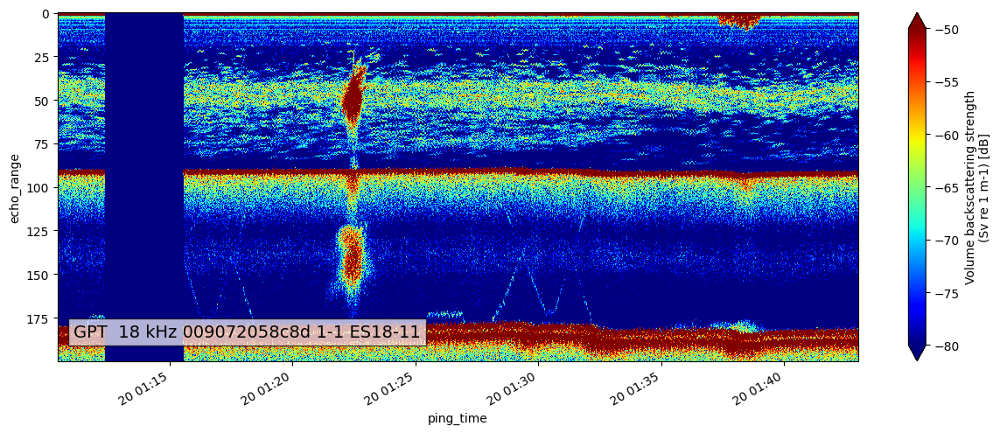

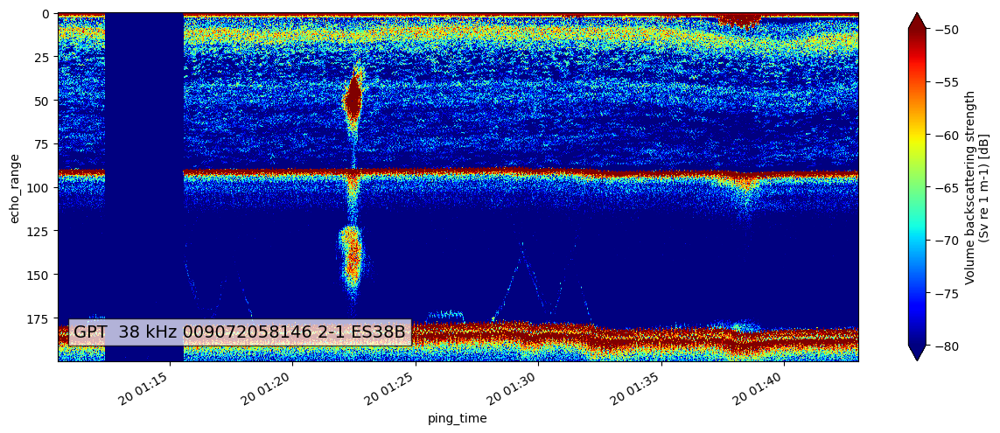

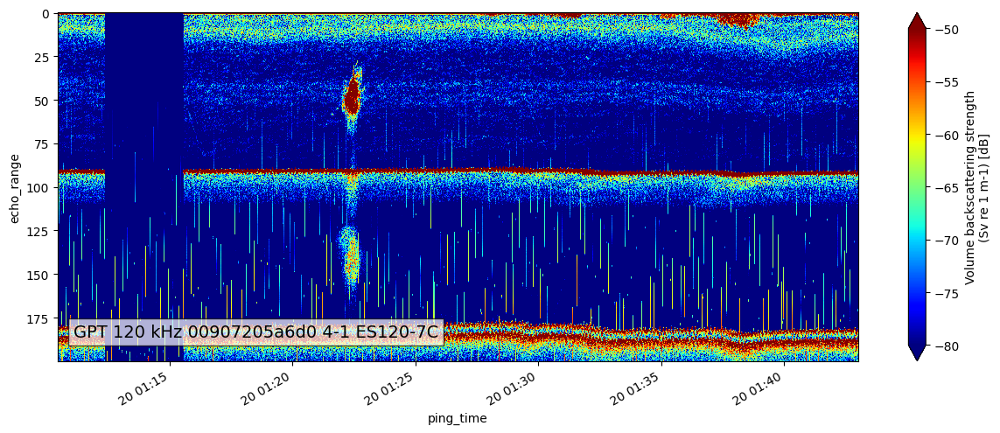

In [17]:
epviz.create_echogram(sv_60_ds,vmin=-80,vmax=-50)

#### Sv - ek80 - echogram - with noise

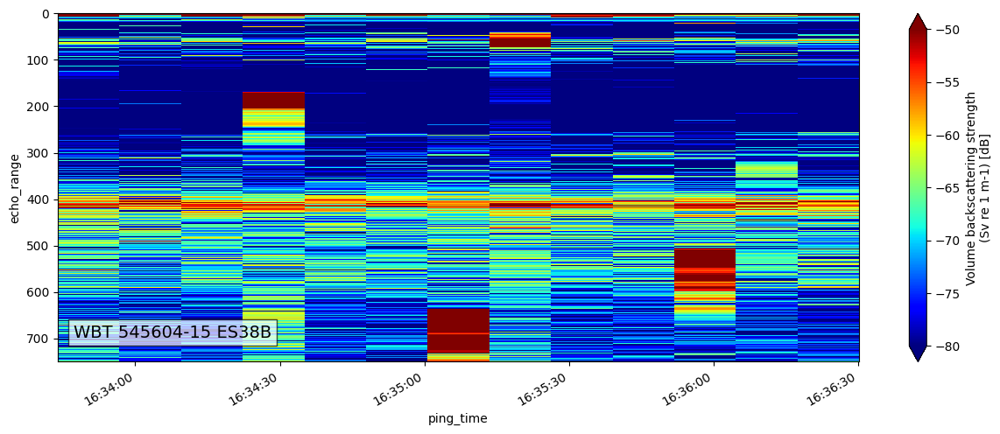

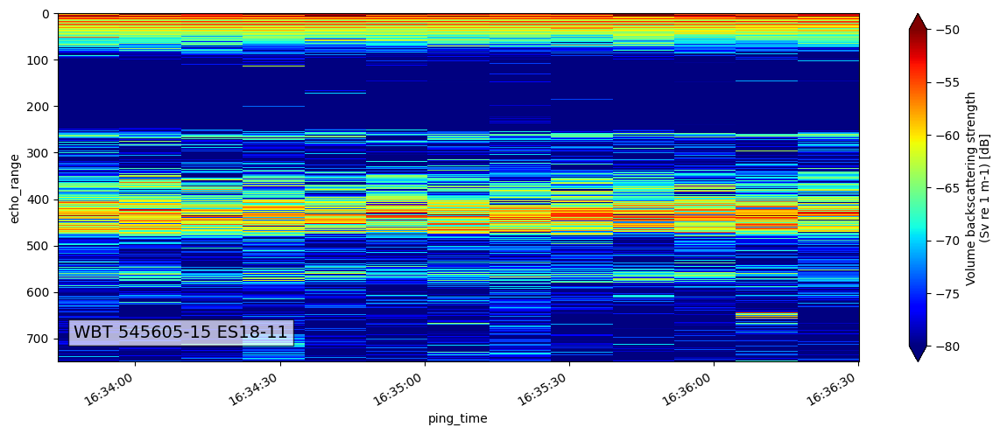

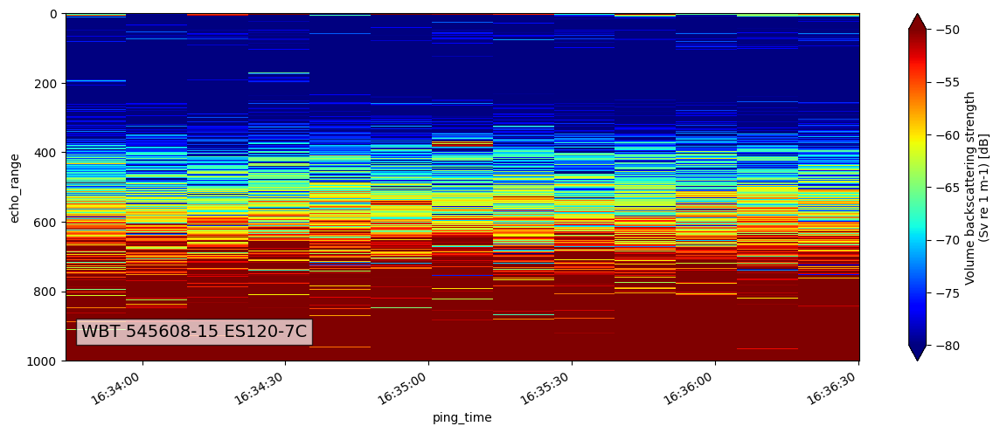

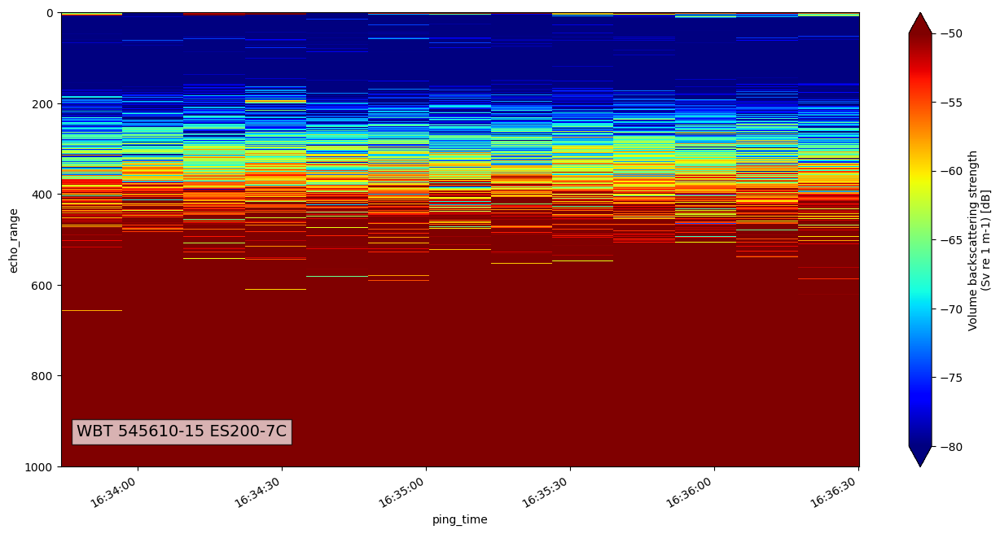

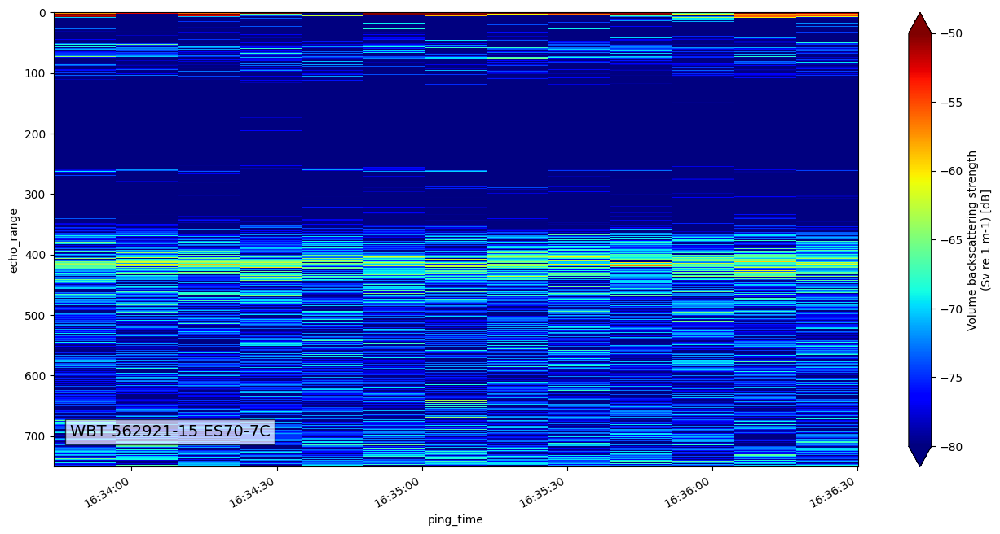

In [18]:
selected_channels = sv_80_ds.sel(channel=['WBT 545604-15 ES38B', 'WBT 545605-15 ES18-11', 'WBT 545608-15 ES120-7C'])
epviz.create_echogram(selected_channels,vmin=-80,vmax=-50)
selected_channels = sv_80_ds.sel(channel=['WBT 545610-15 ES200-7C', 'WBT 562921-15 ES70-7C'])
epviz.create_echogram(selected_channels,vmin=-80,vmax=-50)

### Sv dataset extension

In [19]:
from oceanstream.L2_calibrated_data import(
    sv_dataset_extension
)

In [20]:
extended_sv_60_ds = sv_dataset_extension.enrich_sv_dataset(sv = sv_60_ds, echodata = ek60_ed, waveform_mode="CW", encode_mode="power")
extended_sv_60_ds

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) <U37 'GPT  18 kHz 009072058c8d 1...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/21)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    water_level                    float64 9.15
    depth                          (channel, ping_time, range_sample) float64 ...
    latitude                       (ping_time) float64 nan 44.71 ... 44.7 44.7
    longitude                      (ping_time) float64 nan -124.3 ... -124.4
    angle_alongship                (channel, ping_time, range_sample) float64 ...
    angle_athwartship              (channel, ping_time, range_sample) float64 ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2323+g119e831
    processing_time:              2023-10-09T07:37:42Z
    processing_function:          calibrate.compute_Sv
    processing_level:             Level 2A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...

In [21]:
extended_sv_80_ds = sv_dataset_extension.enrich_sv_dataset(sv = sv_80_ds, \
                                                           echodata = ek80_ed, 
                                                           waveform_mode="CW", 
                                                           encode_mode="power")
extended_sv_80_ds

/Users/simedroniraluca/Documents/pineview/oceanstream/oceanstream/L2_calibrated_data/sv_dataset_extension.py:70: UserWarning: Failed to add location due to error: Reindexing only valid with uniquely valued Index objects
  warnings.warn(f"Failed to add location due to error: {str(e)}")
/Users/simedroniraluca/Documents/pineview/oceanstream/oceanstream/L2_calibrated_data/sv_dataset_extension.py:75: UserWarning: Failed to add split-beam angle due to error: Data provided does not correspond to encode_mode='power'!
  warnings.warn(f"Failed to add split-beam angle due to error: {str(e)}")


<xarray.Dataset>
Dimensions:                        (channel: 5, ping_time: 13,
                                    range_sample: 123897, filenames: 1)
Coordinates:
  * channel                        (channel) <U22 'WBT 545604-15 ES38B' ... '...
  * ping_time                      (ping_time) datetime64[ns] 2016-11-09T16:3...
  * range_sample                   (range_sample) int64 0 1 2 ... 123895 123896
  * filenames                      (filenames) int64 0
Data variables: (12/25)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 3.8e+04 1.8e+04 ... 7e+04
    sound_speed                    float64 1.514e+03
    sound_absorption               (channel) float64 0.007929 ... 0.01852
    temperature                    float64 10.0
    ...                             ...
    impedance_transducer           (channel) int64 75 75 75 75 75
    impedance_transceiver          int64 1000
    receiver_sampling_frequency    (channel) int64 1500000 1500000 ... 1500000
    source_filenames               (filenames) <U98 '/Users/simedroniraluca/D...
    water_level                    float64 nan
    depth                          (channel, ping_time, range_sample) float64 ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2323+g119e831
    processing_time:              2023-10-09T07:37:46Z
    processing_function:          calibrate.compute_Sv

### Noise masks

**Based on the article:**  
[Haris, K., et al. "Sounding out life in the deep using acoustic data from ships of opportunity." Scientific Data 8.1 (2021): 23.](https://www.nature.com/articles/s41597-020-00785-8)

The order of cleaning process steps should be to find and apply:
1. `Impulse noise mask`
2. `Attenuated signal mask`
3. `Transient noise mask`
4. `Background noise mask`

This sequence is explicitly illustrated in "Figure 5" of the article (also attached below). The `false seabed` should be identified and eliminated before the steps enumerated above. While this isn't explicitly mentioned in the article, it can be inferred.

For more on background noise, refer to the article ["A post-processing technique to estimate the signal-to-noise ratio and remove echosounder background noise" published in ICES Journal of Marine Sciences (64(6): 1282–1291)](https://academic.oup.com/icesjms/article/64/6/1282/616894). This source further explains why background noise should be eliminated after the impulse noise, attenuated signal, and transient noise have been addressed.

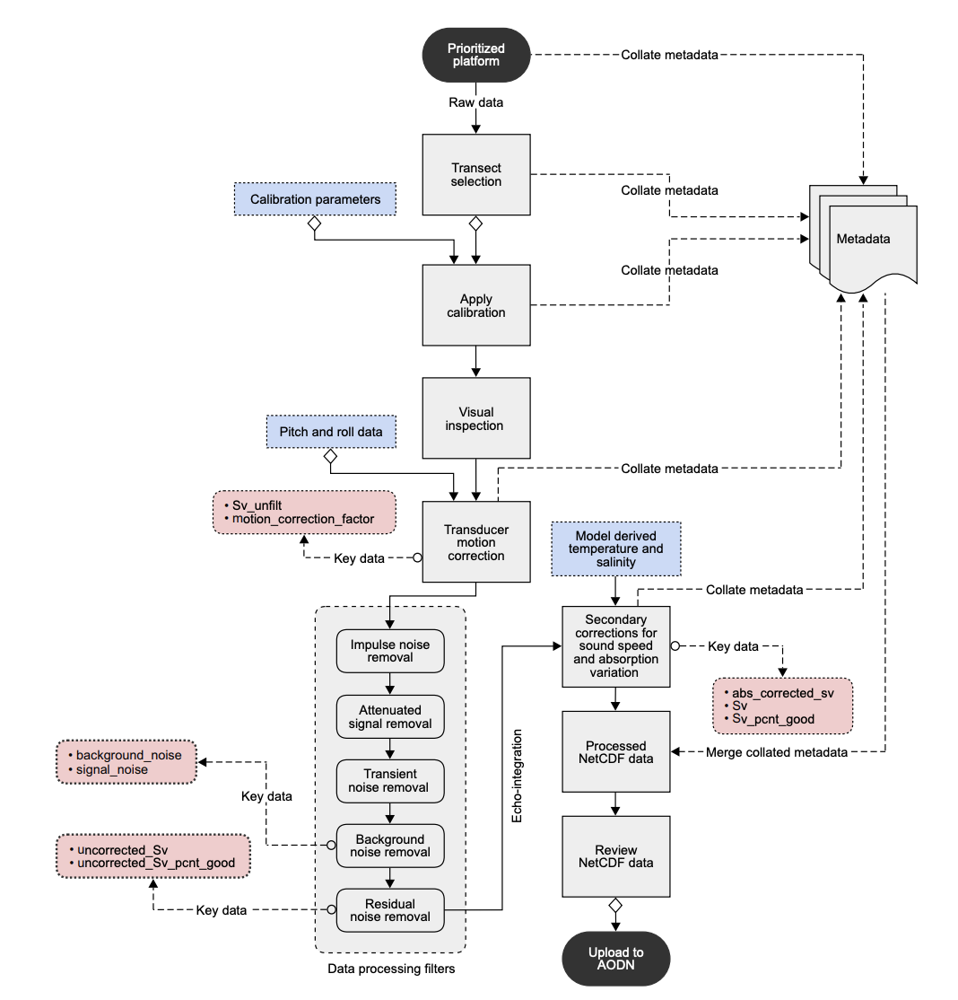

In [22]:
from IPython.display import display, Image
display(Image(filename=os.path.join(project_root, "notebooks", "denoise_stepts.png")))

In [23]:
import time

import echopype as ep
from oceanstream.L2_calibrated_data import noise_masks

**EK60 - Noise masks**

- Compute noise masks and add them as variables to the dataset (using `noise_masks.create_noise_masks_rapidkrill` function)

In [24]:
%time
extended_and_masks_sv_60_ds = noise_masks.create_noise_masks_rapidkrill(extended_sv_60_ds)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.2 µs


/Users/simedroniraluca/Documents/pineview/oceanstream/.venv/lib/python3.9/site-packages/echopype/clean/impulse_noise.py:105: UserWarning: Input Sv data contains NaN values.These values are not processed correctly by the impulse noise removal algorithmand will be marked as noise in the output mask.Please ensure that Sv data is cleaned or appropriately preprocessed before using this function.
  warnings.warn(
/Users/simedroniraluca/Documents/pineview/oceanstream/.venv/lib/python3.9/site-packages/echopype/clean/impulse_noise.py:197: UserWarning: The output mask from this function identifies regions of noise in the Sv data, but does not modify them in the same way as the `wang` function from echopy.Visualizations using this mask may therefore differ fromthose generated using the `wang` function from echopy. Be aware that regions marked as True in the mask are identified as noise.
  warnings.warn(
/Users/simedroniraluca/Documents/pineview/oceanstream/.venv/lib/python3.9/site-packages/echopy

In [25]:
# See how the dataset looks
extended_and_masks_sv_60_ds

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) object 'GPT  18 kHz 009072058c8d...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/26)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    angle_athwartship              (channel, ping_time, range_sample) float64 ...
    mask_transient                 (channel, ping_time, range_sample) bool Tr...
    mask_impulse                   (channel, ping_time, range_sample) bool Fa...
    mask_attenuation               (channel, ping_time, range_sample) bool Fa...
    mask_seabed                    (channel, ping_time, range_sample) bool Tr...
    mask_false_seabed              (channel, ping_time, range_sample) bool Tr...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2323+g119e831
    processing_time:              2023-10-09T07:37:42Z
    processing_function:          calibrate.compute_Sv
    processing_level:             Level 2A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...

**Remark on masks**: It would be useful for all added masks to carry metadata that details the method employed (e.g. `wang` for impulse noise). Such information enhances clarity. 

- `Apply only false seabed mask` - applying the false seabed mask obtained using the method from the noise_masks.create_noise_masks_rapidkrill function, with method=`ariza`

In [26]:
ds_no_false_seabed = ep.mask.apply_mask(
    extended_and_masks_sv_60_ds,
    extended_and_masks_sv_60_ds['mask_false_seabed']
)


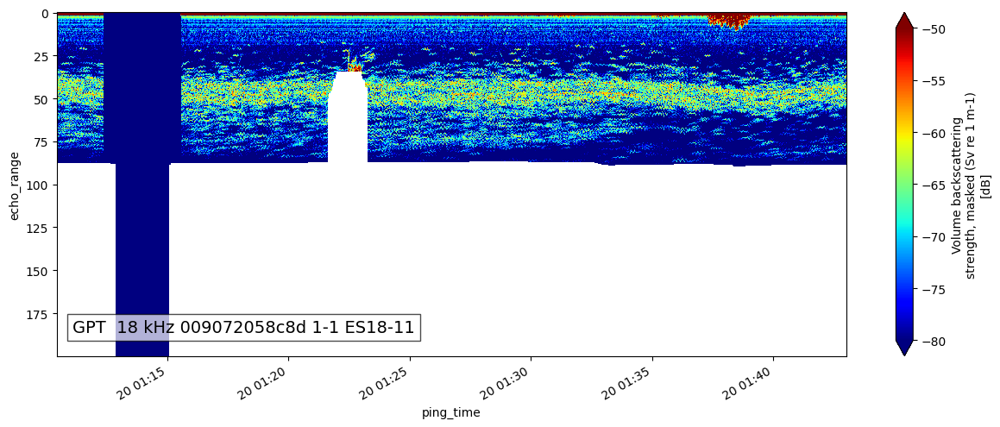

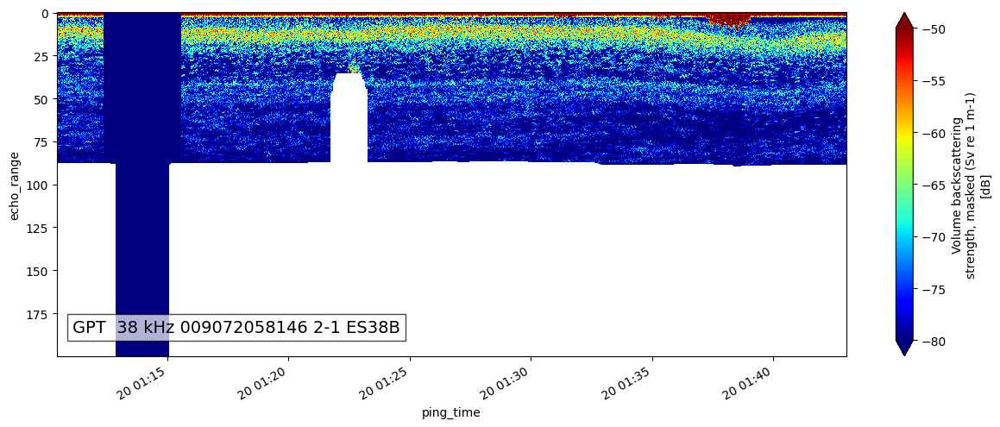

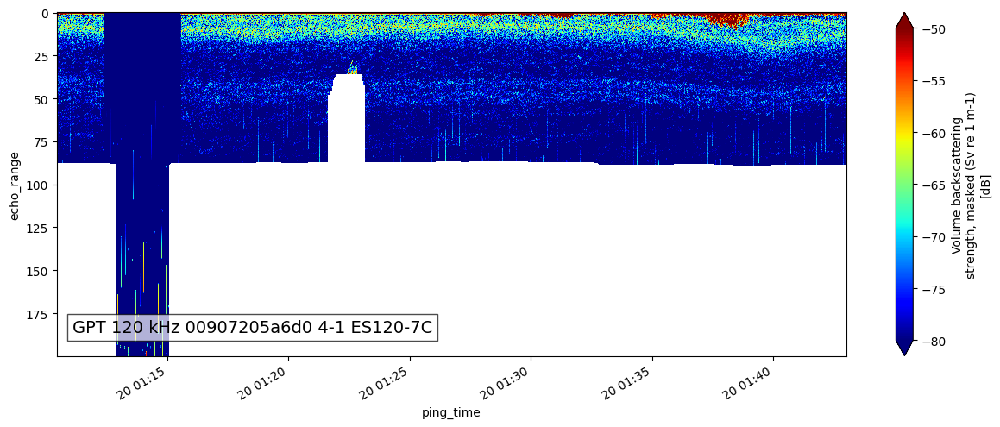

In [27]:
epviz.create_echogram(ds_no_false_seabed,vmin=-80,vmax=-50)

- `Apply only seabed mask` - applying the seabed mask obtained using the method from the noise_masks.create_noise_masks_rapidkrill function, with method=`blackwell`

In [28]:
ds_no_seabed = ep.mask.apply_mask(
    extended_and_masks_sv_60_ds,
    extended_and_masks_sv_60_ds['mask_seabed']
)

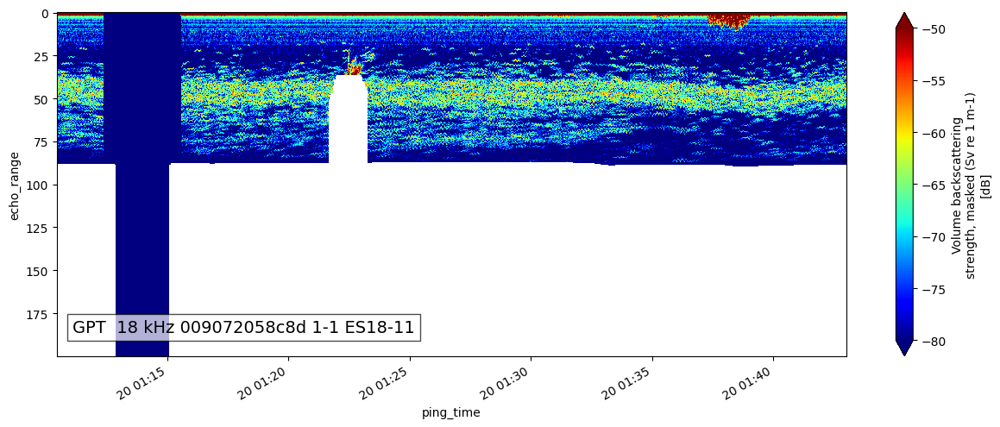

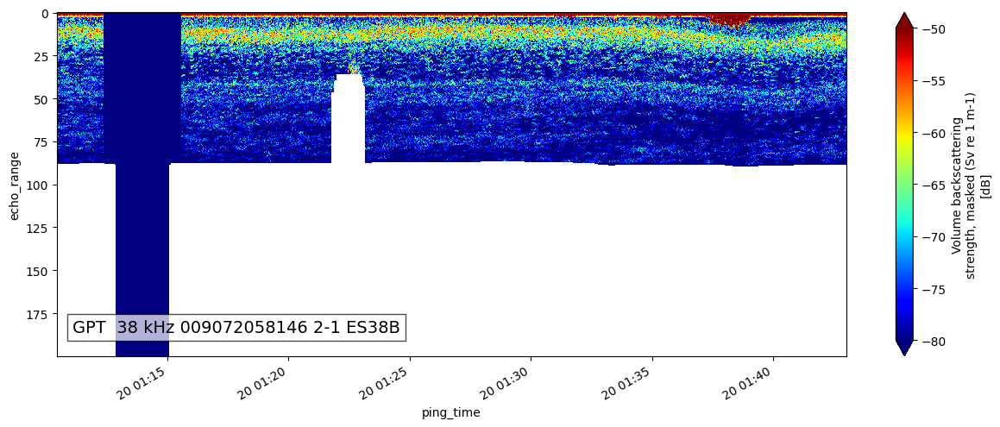

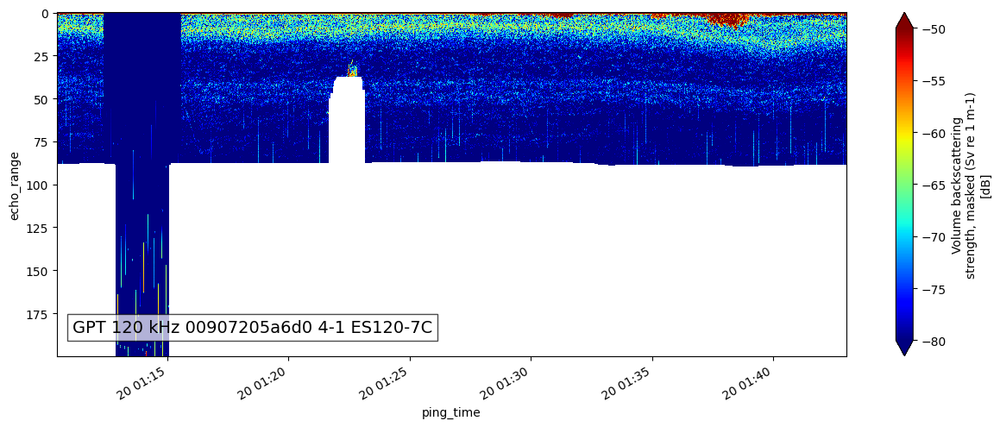

In [29]:
epviz.create_echogram(ds_no_seabed,vmin=-80,vmax=-50)

- `Apply only false seabed mask` - applying the false seabed mask obtained using the noise_masks.create_seabed_mask function, with method=`blackwell_mod`

In [30]:
ds_no_seabed_b_m_mask = noise_masks.create_seabed_mask(
    extended_and_masks_sv_60_ds,
    method="blackwell_mod",
    )
ds_no_seabed_b_m_mask = noise_masks.add_metadata_to_mask(
    mask=ds_no_seabed_b_m_mask, metadata={"mask_type": "false_seabed", "method":"blackwell_mod"}
)
ds_no_seabed_b_m = ep.mask.apply_mask(
    extended_and_masks_sv_60_ds,
    ds_no_seabed_b_m_mask
)

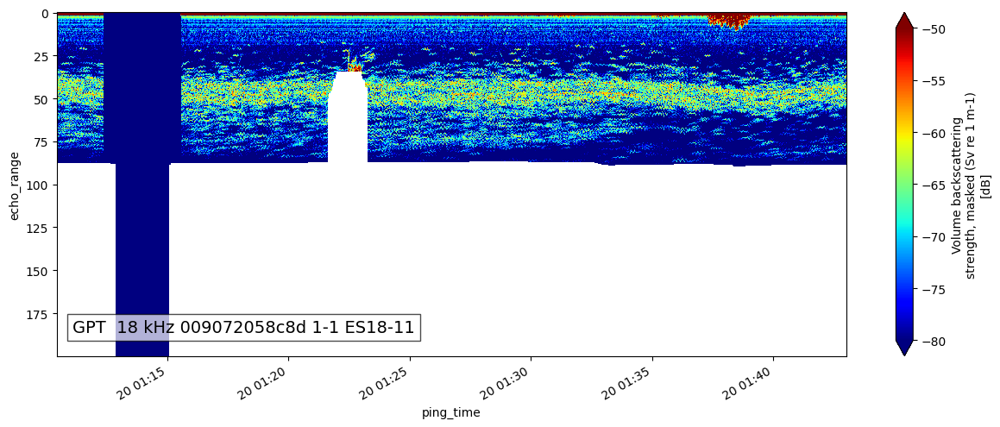

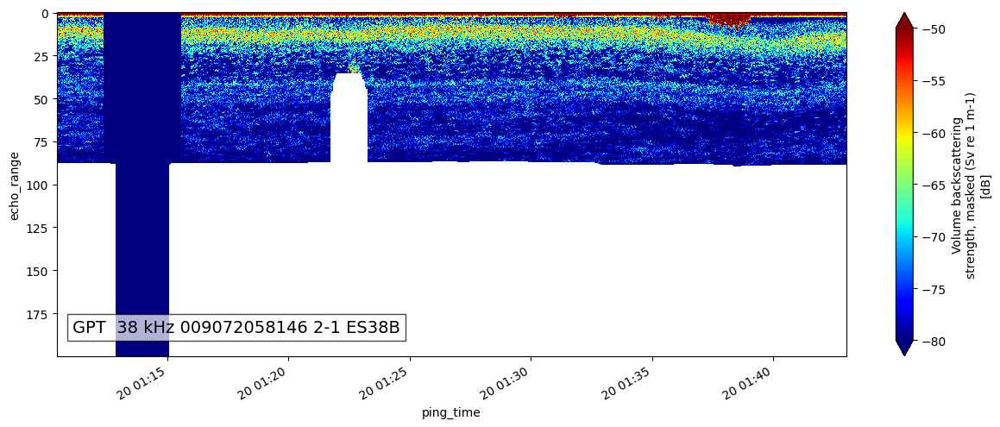

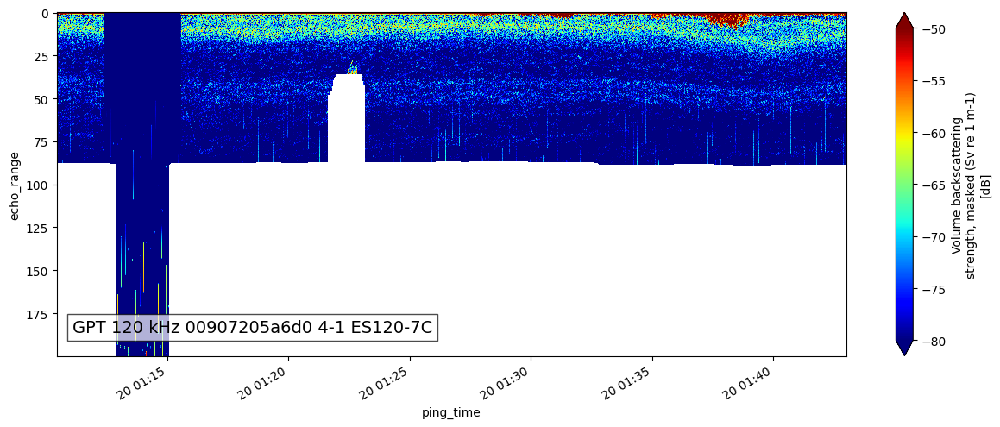

In [31]:
epviz.create_echogram(ds_no_seabed_b_m, vmin=-80,vmax=-50)

**Remark**: The false bottom detection shouldn't be applied by default. As demonstrated in the example above, it might inadvertently mask valuable signal.

`Apply only impulse noise mask`
- applying the impulse noise mask obtained using the method from the noise_masks.create_noise_masks_rapidkrill function, with method=`wang`

In [32]:
ds_no_impulse_noise = ep.mask.apply_mask(
    extended_and_masks_sv_60_ds,
    extended_and_masks_sv_60_ds['mask_impulse']
)

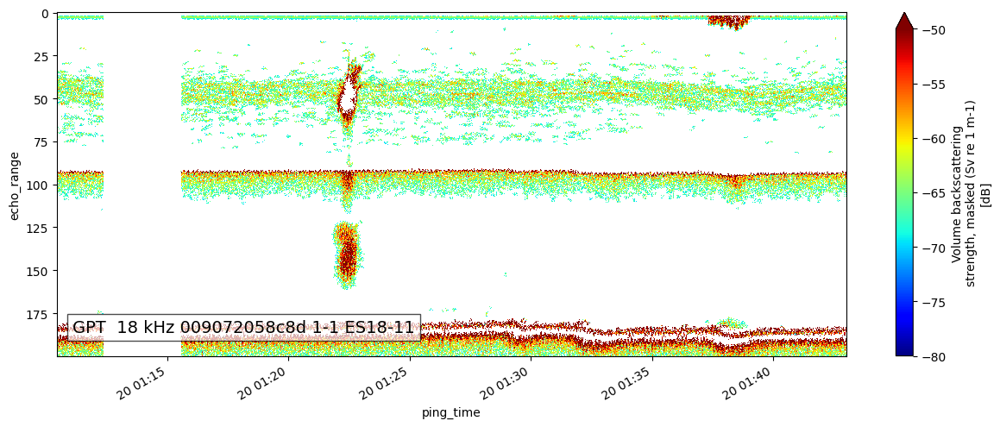

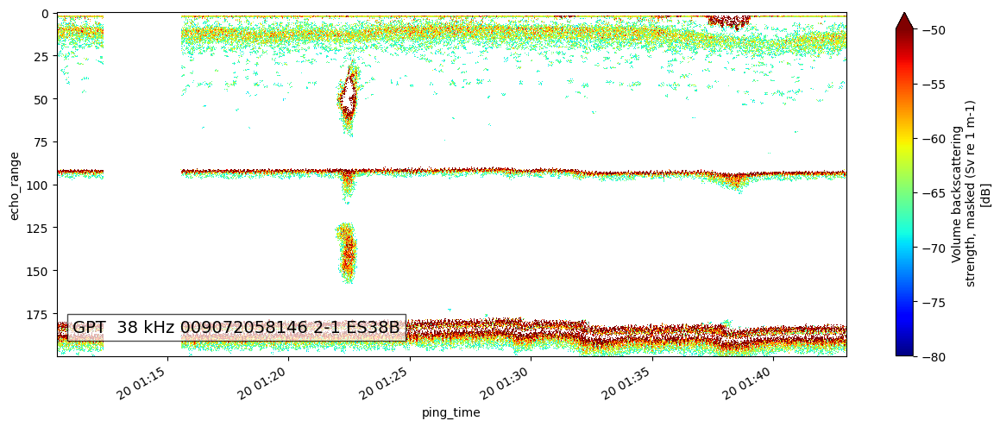

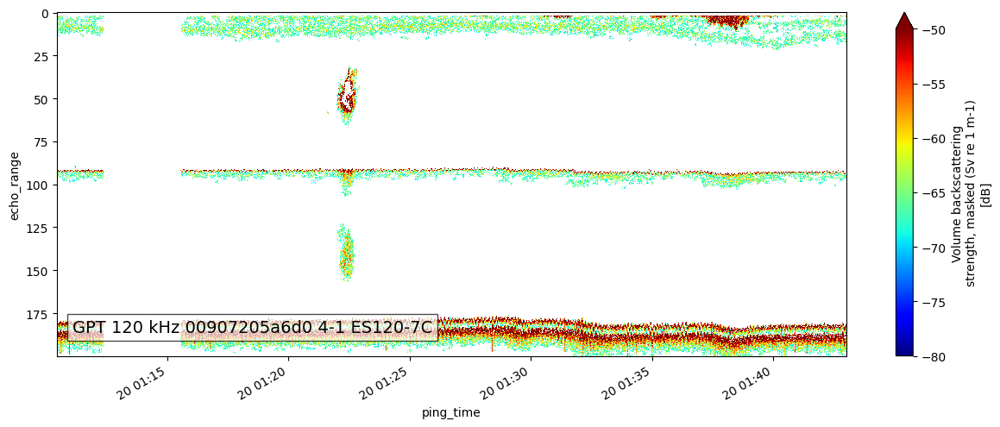

In [33]:
epviz.create_echogram(ds_no_impulse_noise,vmin=-80,vmax=-50)

`Apply only impulse noise mask`
- applying the impulse noise mask obtained using the noise_masks.create_impulse_mask, with method=`ryan`

In [34]:
ryan_impulse_mask_param = {"thr": 10, "m": 5, "n": 1}
ryan_impulse_mask = noise_masks.create_impulse_mask(
    extended_and_masks_sv_60_ds, 
    parameters=ryan_impulse_mask_param, method="ryan"
)


ryan_impulse_mask = noise_masks.add_metadata_to_mask(
    mask=ryan_impulse_mask, metadata={"mask_type": "impulse noise", "method":"ryan"}
)

ds_no_ryan_impulse_noise = ep.mask.apply_mask(
    extended_and_masks_sv_60_ds,
    ryan_impulse_mask
)

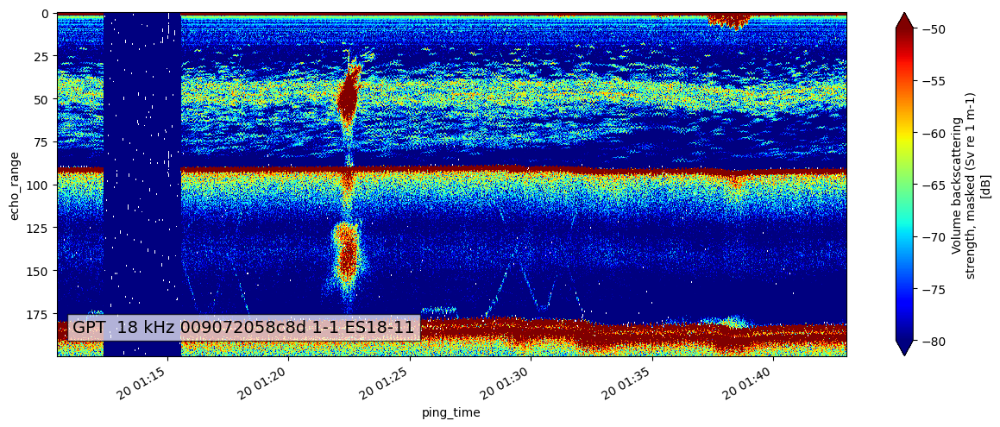

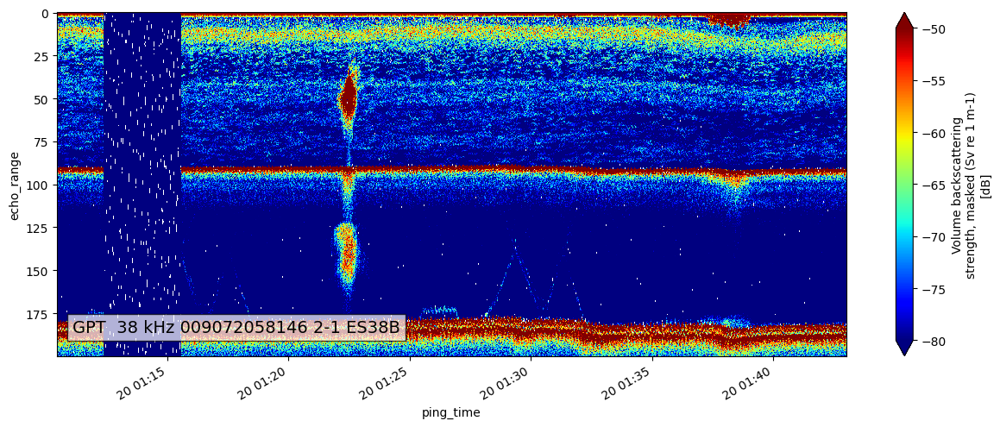

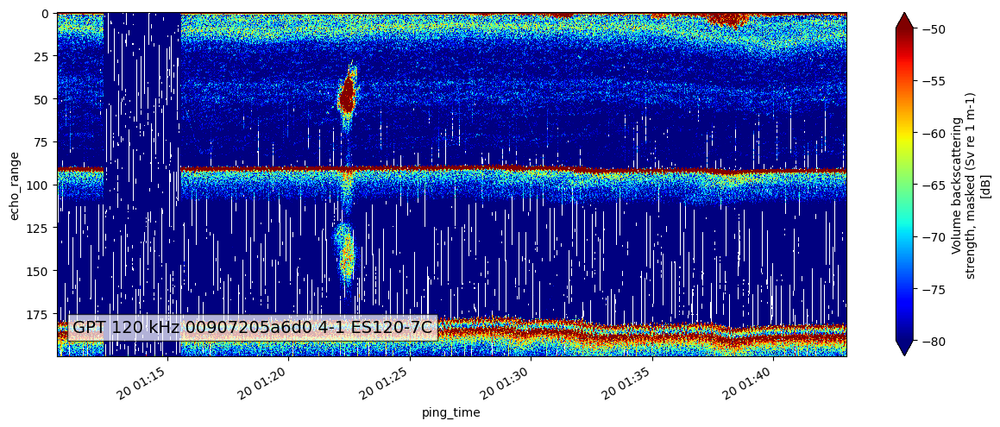

In [35]:
epviz.create_echogram(ds_no_ryan_impulse_noise,vmin=-80,vmax=-50)

`Apply only attenuation mask `
- applying the attenuation mask obtained using the method from the noise_masks.create_noise_masks_rapidkrill function, with method=`ryan`

In [36]:
ds_no_attenuation = ep.mask.apply_mask(
    extended_and_masks_sv_60_ds,
    extended_and_masks_sv_60_ds['mask_attenuation']
)

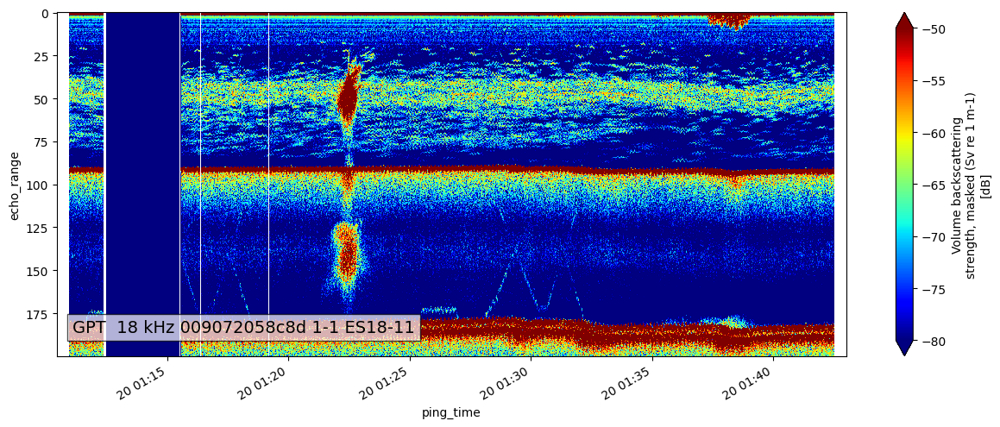

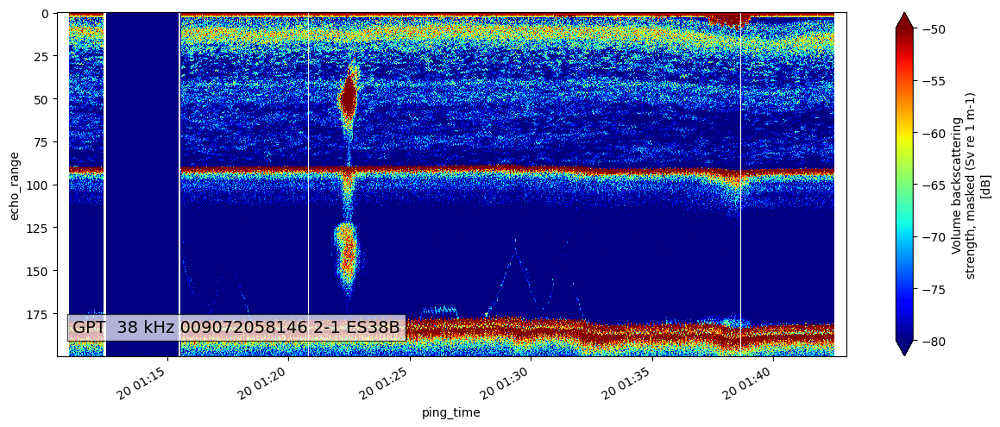

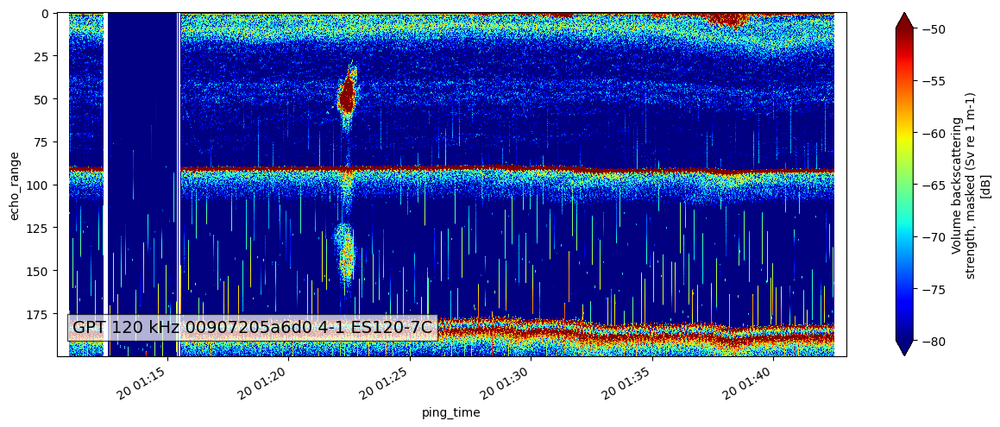

In [37]:
epviz.create_echogram(ds_no_attenuation,vmin=-80,vmax=-50)

`Apply only transient mask`
- applying the transient mask obtained using the method from the noise_masks.create_noise_masks_rapidkrill function, with method=`ryan`

In [38]:
ds_no_transient = ep.mask.apply_mask(
    extended_and_masks_sv_60_ds,
    extended_and_masks_sv_60_ds['mask_transient']
)

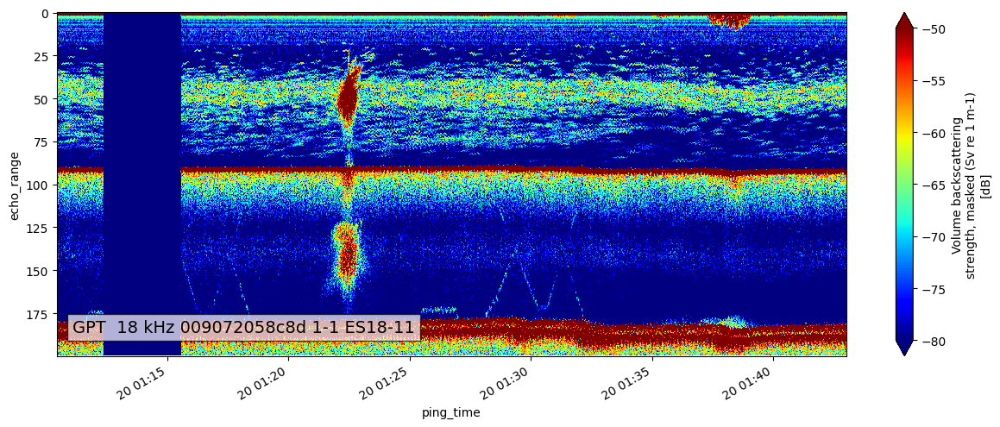

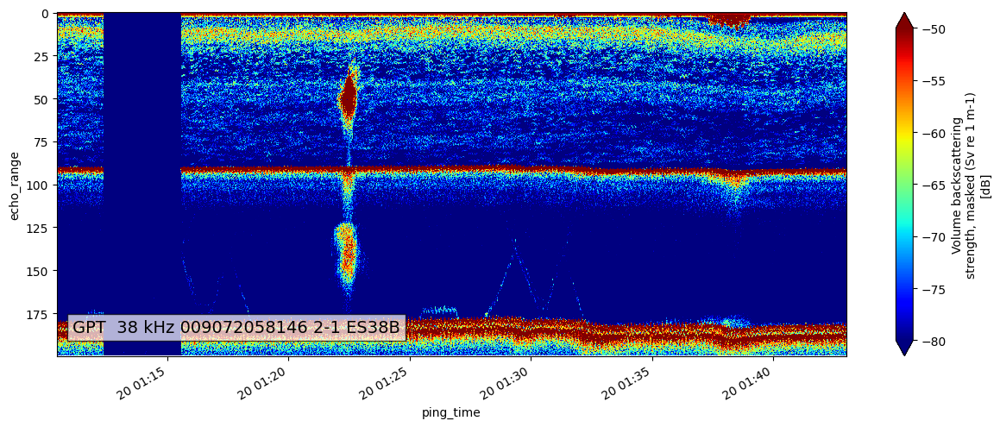

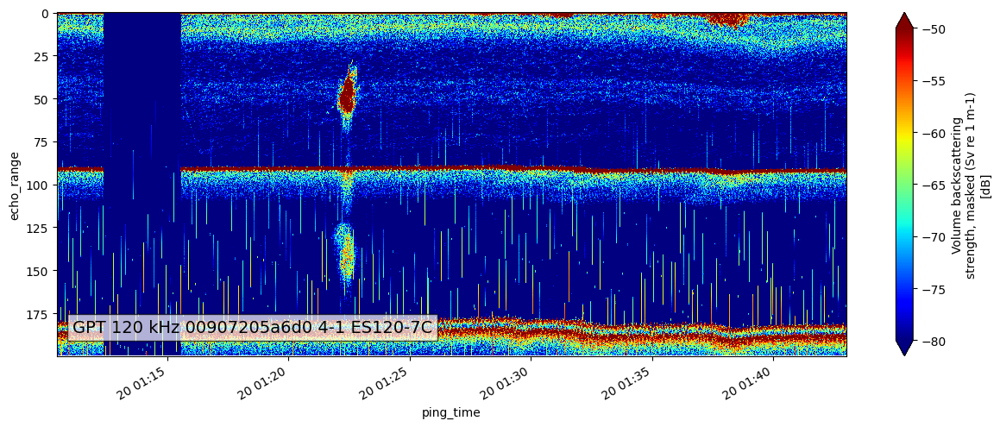

In [39]:
epviz.create_echogram(ds_no_transient,vmin=-80,vmax=-50)

**Background noise**

`Apply only background noise mask`
- applying the background noise mask obtained using the apply_remove_background_noise function

In [40]:
from oceanstream.L2_calibrated_data import background_noise_remover

In [41]:
ds_no_background_noise = background_noise_remover. apply_remove_background_noise(extended_and_masks_sv_60_ds)

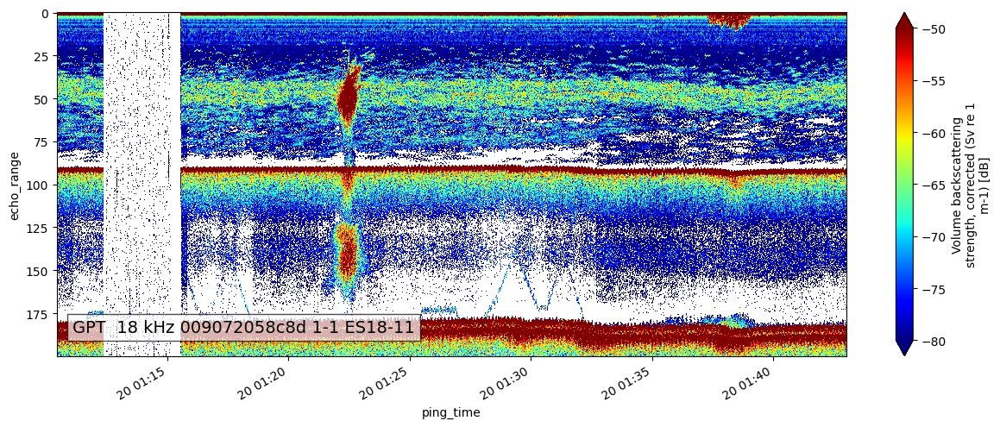

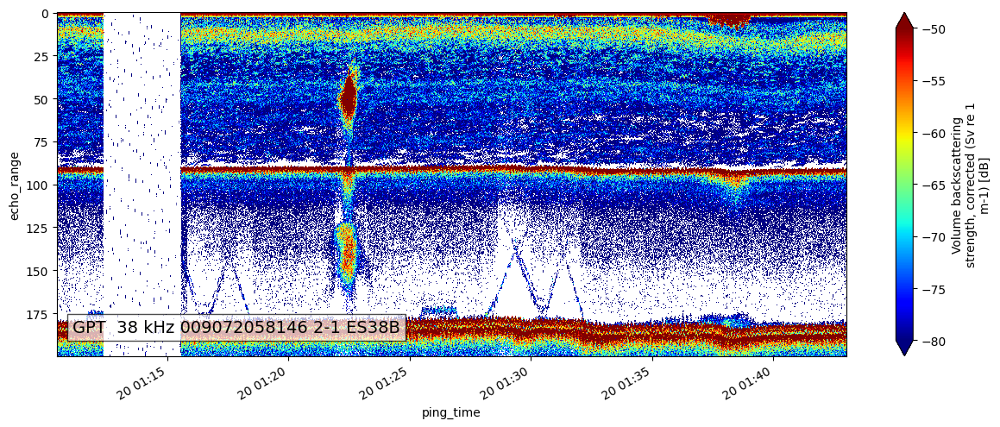

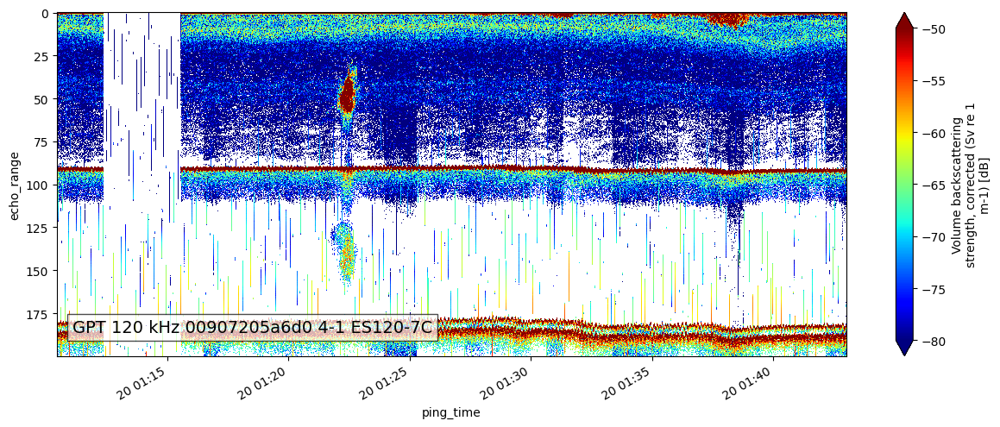

In [42]:
epviz.create_echogram(ds_no_background_noise,vmin=-80,vmax=-50)

In the next step, the masks are applied to the dataset in the following order:

1. `Apply impulse noise mask`
    - applying the impulse noise mask obtained using the noise_masks.create_impulse_mask, with method=`ryan`

2. `Apply attenuation mask `
    - applying the attenuation mask obtained using the method from the noise_masks.create_noise_masks_rapidkrill function, with method=`ryan`

3. `Apply transient mask`
    - applying the transient mask obtained using the method from the noise_masks.create_noise_masks_rapidkrill function, with method=`ryan`

4. `Apply background noise mask`
    - applying the background noise mask obtained using the apply_remove_background_noise function


In [43]:
ryan_impulse_mask_param = {"thr": 10, "m": 5, "n": 1}
ryan_impulse_mask = noise_masks.create_impulse_mask(
    extended_and_masks_sv_60_ds, 
    parameters=ryan_impulse_mask_param, method="ryan"
)

ryan_impulse_mask = noise_masks.add_metadata_to_mask(
    mask=ryan_impulse_mask, metadata={"mask_type": "impulse noise", "method":"ryan"}
)
ds_no_ryan_impulse_noise = ep.mask.apply_mask(
    extended_and_masks_sv_60_ds,
    ryan_impulse_mask
)



ds_no_attenuation = ep.mask.apply_mask(
    ds_no_ryan_impulse_noise,
    extended_and_masks_sv_60_ds['mask_attenuation']
)



ds_no_transient = ep.mask.apply_mask(
    ds_no_attenuation,
    extended_and_masks_sv_60_ds['mask_transient']
)


ds_no_background_noise = background_noise_remover.apply_remove_background_noise(ds_no_transient, noise_max= -125)

ds_no_background_noise

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) object 'GPT  18 kHz 009072058c8d...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/28)
    Sv_with_background_noise       (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    mask_impulse                   (channel, ping_time, range_sample) bool Fa...
    mask_attenuation               (channel, ping_time, range_sample) bool Fa...
    mask_seabed                    (channel, ping_time, range_sample) bool Tr...
    mask_false_seabed              (channel, ping_time, range_sample) bool Tr...
    Sv_noise                       (channel, ping_time, range_sample) float64 ...
    Sv                             (channel, ping_time, range_sample) float64 ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2323+g119e831
    processing_time:              2023-10-09T07:39:21Z
    processing_function:          clean.remove_noise
    processing_level:             Level 3B
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...
    mask_software_name:           echopype
    mask_software_version:        0.1.dev2323+g119e831
    mask_time:                    2023-10-09T07:39:20Z
    mask_function:                mask.apply_mask

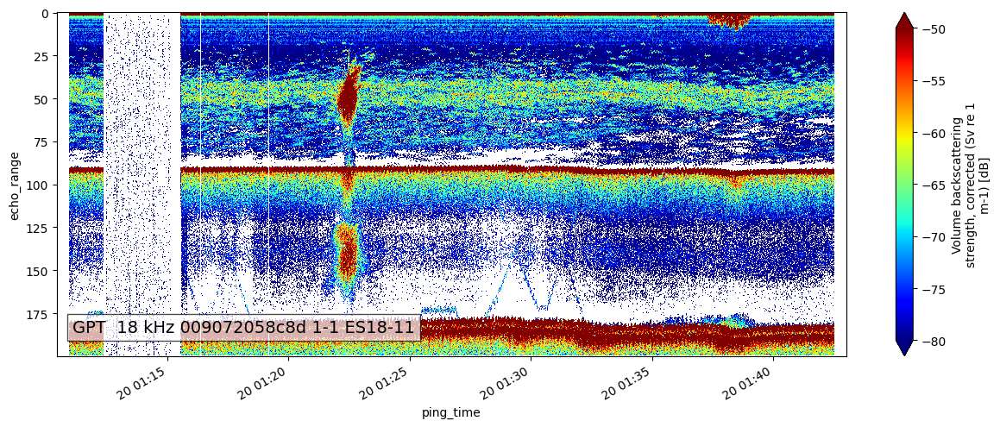

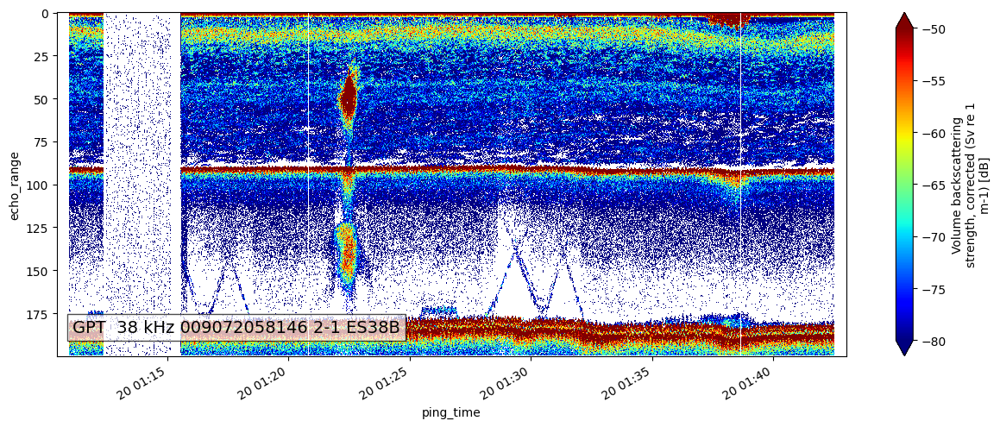

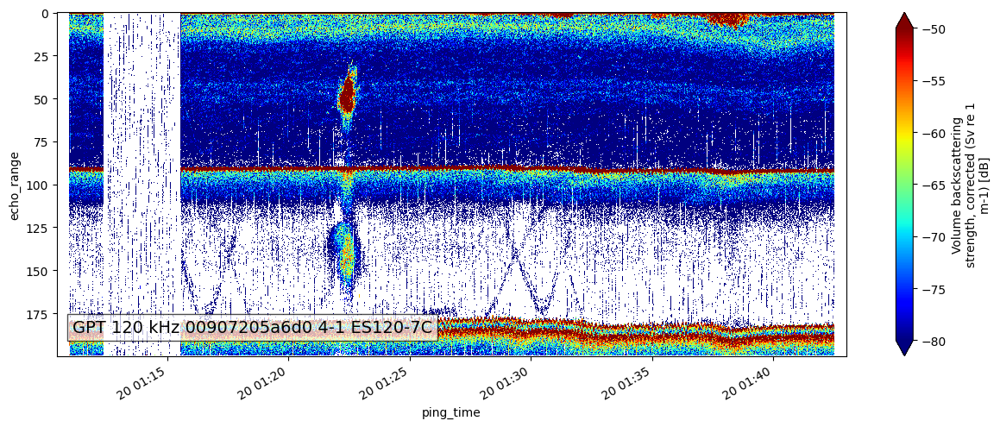

In [44]:
epviz.create_echogram(ds_no_background_noise,vmin=-80,vmax=-50)

**Save noise free EK60 datset**

**! Important Remark:**
- When saving the processed data, it's important to ensure that the noise_max attribute is not set to None.

In [45]:
from oceanstream.L2_calibrated_data import processed_data_io
processed_data_io.write_processed(
    sv = ds_no_background_noise,
    file_path = L2_tour_data_path,
    file_name = "noise_free_EK60",
    file_type = "nc",
)


### Sv interpolation

In [46]:
from oceanstream.L2_calibrated_data import sv_interpolation

In [47]:
# Update the Sv DataArray in the ds_no_background_noise dataset with the interpolated values
sv_interpolation.interpolate_sv(ds_no_background_noise)

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) <U37 'GPT  18 kHz 009072058c8d 1...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/28)
    Sv_with_background_noise       (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    mask_impulse                   (channel, ping_time, range_sample) bool Fa...
    mask_attenuation               (channel, ping_time, range_sample) bool Fa...
    mask_seabed                    (channel, ping_time, range_sample) bool Tr...
    mask_false_seabed              (channel, ping_time, range_sample) bool Tr...
    Sv_noise                       (channel, ping_time, range_sample) float64 ...
    Sv                             (channel, ping_time, range_sample) float64 ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2323+g119e831
    processing_time:              2023-10-09T07:39:21Z
    processing_function:          clean.remove_noise
    processing_level:             Level 3B
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...
    mask_software_name:           echopype
    mask_software_version:        0.1.dev2323+g119e831
    mask_time:                    2023-10-09T07:39:20Z
    mask_function:                mask.apply_mask

**Remark**:
The `sv_interpolation.interpolate_sv` function alters the input dataset directly. It might be a better practice to ensure it doesn't modify the original dataset.

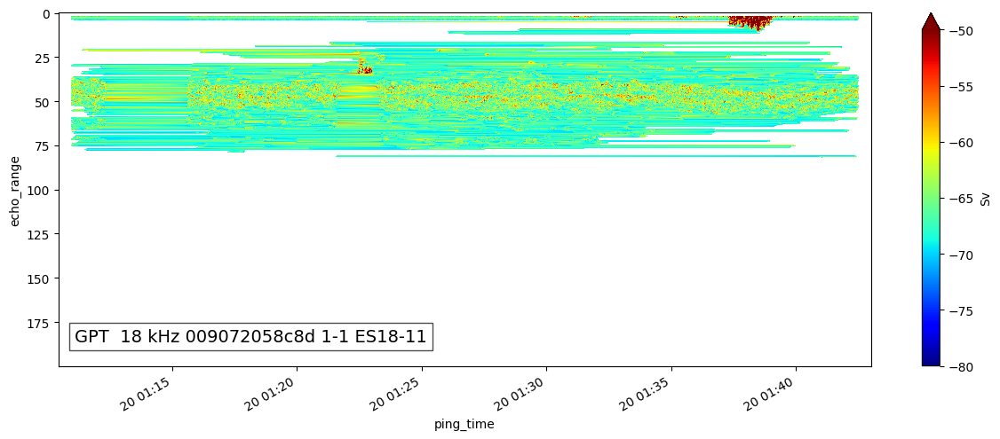

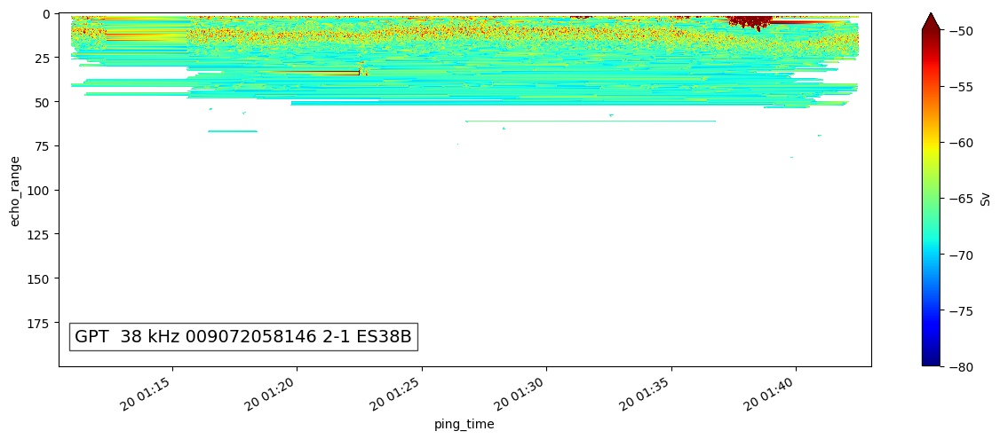

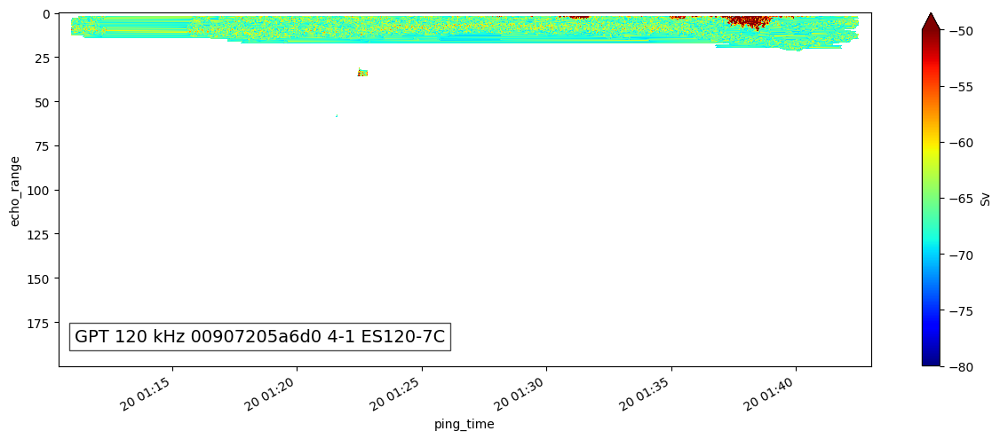

In [48]:
epviz.create_echogram(ds_no_background_noise,vmin=-80,vmax=-50)

In [49]:
sv_interpolation.interpolate_sv(ds_no_ryan_impulse_noise)

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) <U37 'GPT  18 kHz 009072058c8d 1...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/26)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    angle_athwartship              (channel, ping_time, range_sample) float64 ...
    mask_transient                 (channel, ping_time, range_sample) bool Tr...
    mask_impulse                   (channel, ping_time, range_sample) bool Fa...
    mask_attenuation               (channel, ping_time, range_sample) bool Fa...
    mask_seabed                    (channel, ping_time, range_sample) bool Tr...
    mask_false_seabed              (channel, ping_time, range_sample) bool Tr...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2323+g119e831
    processing_time:              2023-10-09T07:37:42Z
    processing_function:          calibrate.compute_Sv
    processing_level:             Level 3A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...
    mask_software_name:           echopype
    mask_software_version:        0.1.dev2323+g119e831
    mask_time:                    2023-10-09T07:39:19Z
    mask_function:                mask.apply_mask

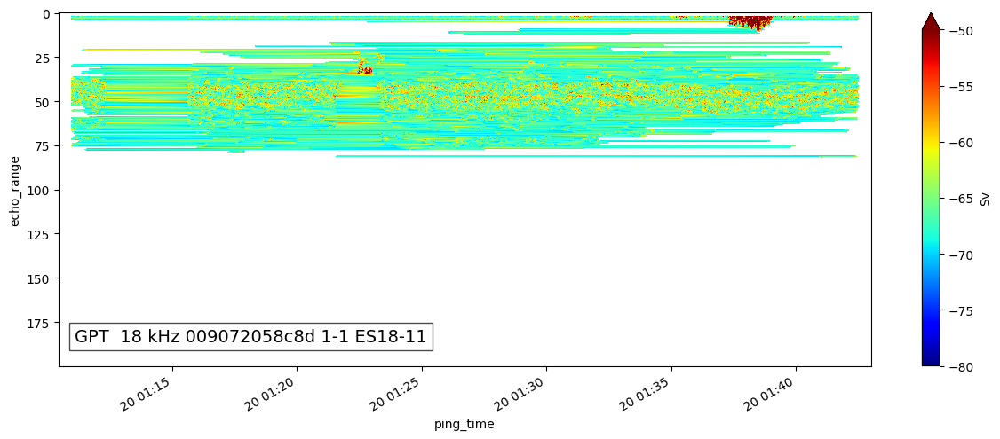

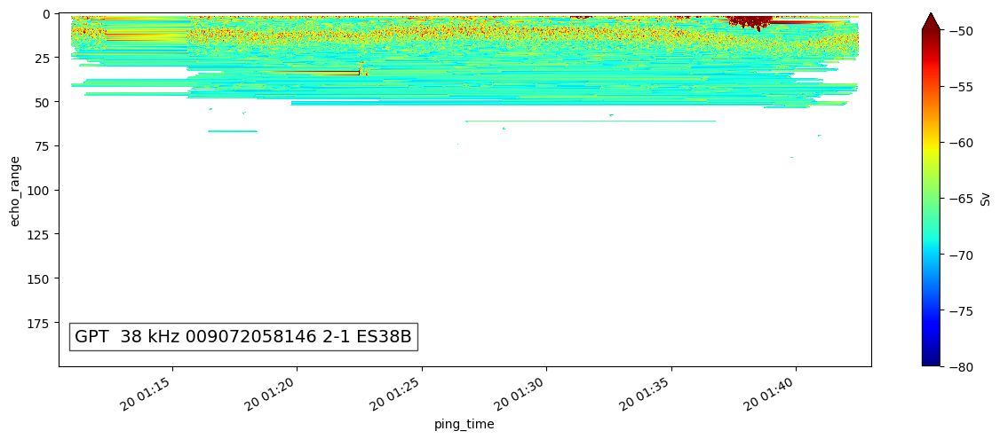

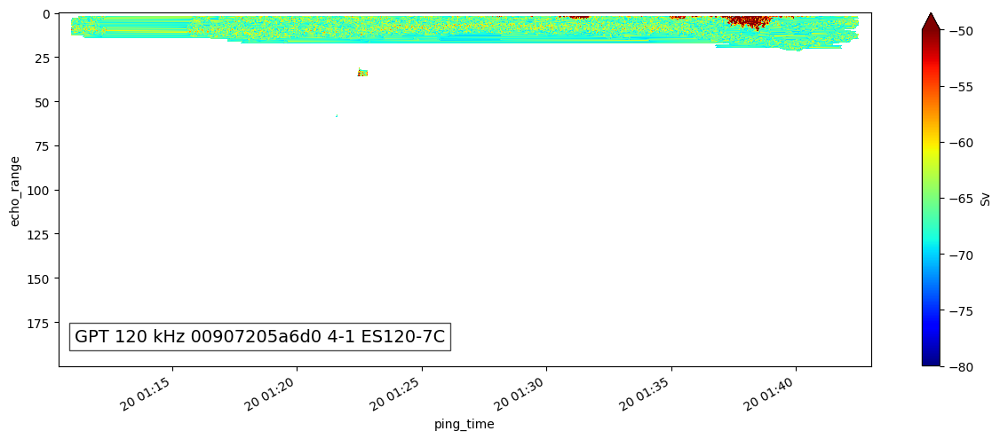

In [50]:
epviz.create_echogram(ds_no_ryan_impulse_noise,vmin=-80,vmax=-50)

**EK80 - Noise masks**

In [51]:
%time
extended_and_masks_sv_80_ds = noise_masks.create_noise_masks_rapidkrill(extended_sv_80_ds)

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 9.06 µs


/Users/simedroniraluca/Documents/pineview/oceanstream/.venv/lib/python3.9/site-packages/echopype/clean/impulse_noise.py:105: UserWarning: Input Sv data contains NaN values.These values are not processed correctly by the impulse noise removal algorithmand will be marked as noise in the output mask.Please ensure that Sv data is cleaned or appropriately preprocessed before using this function.
  warnings.warn(
/Users/simedroniraluca/Documents/pineview/oceanstream/.venv/lib/python3.9/site-packages/echopype/clean/impulse_noise.py:197: UserWarning: The output mask from this function identifies regions of noise in the Sv data, but does not modify them in the same way as the `wang` function from echopy.Visualizations using this mask may therefore differ fromthose generated using the `wang` function from echopy. Be aware that regions marked as True in the mask are identified as noise.
  warnings.warn(
/Users/simedroniraluca/Documents/pineview/oceanstream/.venv/lib/python3.9/site-packages/echopy

In [52]:
processed_data_io.write_processed(
    sv = extended_and_masks_sv_80_ds,
    file_path = L2_tour_data_path,
    file_name = "extended_ds_EK80",
    file_type = "nc",
)

In [53]:
processed_data_io.write_processed(
    sv = extended_and_masks_sv_80_ds,
    file_path = L2_tour_data_path,
    file_name = "extended_ds_EK80",
    file_type = "zarr",
)